In [2]:
# Import some useful modules.
import jax
import jax.numpy as np
import os
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull



# Import JAX-FEM specific modules.
from jax_fem.problem import Problem
from jax_fem.solver import solver
from jax_fem.utils import save_sol
from jax_fem.generate_mesh import box_mesh_gmsh, get_meshio_cell_type, Mesh


### Constitutive relationship
We're using SI units I have decided. 
Note to self: make unit conversion class or copy it from the 'Oumuamua code.

17/02/2025: Tested the limits of compression for sim 1. Crashed for 15%, but interestingly only once we go back up again after compressing fully to 15%. So I guess this is where the 'the cube has changed so the material responds differently now, especially to pulling'  comes into play. Rather than puling, I should unload/release. One more run with 20%, and let's see then.

And now it fails at 13%, in the compression step, for 100 iterations (in the loop). So the failing is very much a numerical thing, because why else would 15% compression work for one sim and not for another, when the only difference is step size? I did this for params1 (Y = 1, nu = 0.05, E = 100). 

19/02/2025: FOund out that stepsize matters in the PETSC_solver, and has nothing to do with $\nu$.Then found out that using jax_solver or umfpack_solver instead lets literally everything converge at 20%, for both stepsizes. So it was the solver :P, at least in part, and defo something numerical.

Also, try different solvers? So I guess the main takeaway is that the convergence issue should be looked at very carefully, and not automatically be attributed to the physics and very much also to the numerics.

[03-03 10:35:36][DEBUG] jax_fem: Computing shape function values, gradients, etc.
[03-03 10:35:36][DEBUG] jax_fem: ele_type = HEX8, quad_points.shape = (num_quads, dim) = (8, 3)
[03-03 10:35:36][DEBUG] jax_fem: face_quad_points.shape = (num_faces, num_face_quads, dim) = (6, 4, 3)
[03-03 10:35:36][DEBUG] jax_fem: Done pre-computations, took 0.054552555084228516 [s]
[03-03 10:35:36][INFO] jax_fem: Solving a problem with 1000 cells, 1331x3 = 3993 dofs.
[03-03 10:35:36][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[03-03 10:35:36][DEBUG] jax_fem: Start timing
[03-03 10:35:36][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Info    : Meshing 1D...
Info    : [  0%] Meshing curve 1 (Extruded)
Info    : [ 10%] Meshing curve 2 (Extruded)
Info    : [ 20%] Meshing curve 3 (Extruded)
Info    : [ 30%] Meshing curve 4 (Extruded)
Info    : [ 40%] Meshing curve 7 (Extruded)
Info    : [ 50%] Meshing curve 8 (Extruded)
Info    : [ 50%] Meshing curve 9 (Extruded)
Info    : [ 60%] Meshing curve 10 (Extruded)
Info    : [ 70%] Meshing curve 12 (Extruded)
Info    : [ 80%] Meshing curve 13 (Extruded)
Info    : [ 90%] Meshing curve 17 (Extruded)
Info    : [100%] Meshing curve 21 (Extruded)
Info    : Done meshing 1D (Wall 0.000186882s, CPU 0.000135s)
Info    : Meshing 2D...
Info    : [  0%] Meshing surface 5 (Extruded)
Info    : [ 20%] Meshing surface 14 (Extruded)
Info    : [ 40%] Meshing surface 18 (Extruded)
Info    : [ 50%] Meshing surface 22 (Extruded)
Info    : [ 70%] Meshing surface 26 (Extruded)
Info    : [ 90%] Meshing surface 27 (Extruded)
Info    : Done meshing 2D (Wall 0.00666747s, CPU 0.008383s)
Info    : Meshing

[03-03 10:35:37][DEBUG] jax_fem: Function split_and_compute_cell took 0.4714 seconds
[03-03 10:35:37][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:37][DEBUG] jax_fem: Before, l_2 res = 0.0, relative l_2 res = nan
[03-03 10:35:37][INFO] jax_fem: Solve took 0.5628383159637451 [s]
[03-03 10:35:37][DEBUG] jax_fem: max of dofs = 0.0
[03-03 10:35:37][DEBUG] jax_fem: min of dofs = 0.0
[03-03 10:35:38][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[03-03 10:35:38][DEBUG] jax_fem: Start timing
[03-03 10:35:38][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[3,3])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8,3,3])>with<BatchTrace(level=1/0)> with
    val = Array([[[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]],


       [[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0

[03-03 10:35:38][DEBUG] jax_fem: Function split_and_compute_cell took 0.1540 seconds
[03-03 10:35:38][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:38][DEBUG] jax_fem: Before, l_2 res = 0.9777777777777779, relative l_2 res = 1.0
[03-03 10:35:38][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:38][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:39][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 1.3577011783409866e-11
[03-03 10:35:39][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:39][DEBUG] jax_fem: Function split_and_compute_cell took 0.1263 seconds
[03-03 10:35:39][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:40][DEBUG] jax_fem: l_2 res = 0.4996296296224494, relative l_2 res = 0.510984848477505
[03-03 10:35:40][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:40][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:40][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 7.991

Traced<ShapedArray(float64[3,3])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8,3,3])>with<BatchTrace(level=1/0)> with
    val = Array([[[[ 3.75661, -0.     ,  0.     ],
         [-0.     ,  3.75661,  0.     ],
         [ 0.     ,  0.     , -8.51323]],

        [[ 3.75661, -0.     ,  0.     ],
         [-0.     ,  3.75661,  0.     ],
         [ 0.     ,  0.     , -8.51323]],

        [[ 3.75661, -0.     ,  0.     ],
         [-0.     ,  3.75661, -0.     ],
         [ 0.     , -0.     , -8.51323]],

        [[ 3.75661, -0.     ,  0.     ],
         [-0.     ,  3.75661, -0.     ],
         [ 0.     , -0.     , -8.51323]],

        [[ 3.75661, -0.     , -0.     ],
         [-0.     ,  3.75661,  0.     ],
         [-0.     ,  0.     , -8.51323]],

        [[ 3.75661, -0.     , -0.     ],
         [-0.     ,  3.75661,  0.     ],
         [-0.     ,  0.     , -8.51323]],

        [[ 3.75661,  0.     , -0.     ],
         [ 0.     ,  3.75661, -0.     ],
         [-0.   

[03-03 10:35:41][DEBUG] jax_fem: Before, l_2 res = 1.9565808549553523, relative l_2 res = 1.0
[03-03 10:35:41][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:41][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:42][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 1.8239164721721156e-10
[03-03 10:35:42][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:42][DEBUG] jax_fem: Function split_and_compute_cell took 0.1299 seconds
[03-03 10:35:42][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:42][DEBUG] jax_fem: l_2 res = 0.12666666670056806, relative l_2 res = 0.06473878469155239
[03-03 10:35:42][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:42][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:43][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 9.61187084952861e-11
[03-03 10:35:43][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:43][DEBUG] jax_fem: Function split_and_comput

Traced<ShapedArray(float64[3,3])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8,3,3])>with<BatchTrace(level=1/0)> with
    val = Array([[[[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.   

[03-03 10:35:44][DEBUG] jax_fem: Before, l_2 res = 2.934016965792058, relative l_2 res = 1.0
[03-03 10:35:44][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:44][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:44][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 9.451528920365418e-11
[03-03 10:35:44][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:44][DEBUG] jax_fem: Function split_and_compute_cell took 0.1295 seconds
[03-03 10:35:44][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:45][DEBUG] jax_fem: l_2 res = 0.12666666666266846, relative l_2 res = 0.043171756721070605
[03-03 10:35:45][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:45][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:45][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 3.5607016966356675e-11
[03-03 10:35:45][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:45][DEBUG] jax_fem: Function split_and_compu

Traced<ShapedArray(float64[3,3])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8,3,3])>with<BatchTrace(level=1/0)> with
    val = Array([[[[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.   

[03-03 10:35:46][DEBUG] jax_fem: Before, l_2 res = 3.911623861591012, relative l_2 res = 1.0
[03-03 10:35:46][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:46][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:47][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 2.2857932053735348e-10
[03-03 10:35:47][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:47][DEBUG] jax_fem: Function split_and_compute_cell took 0.1220 seconds
[03-03 10:35:47][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:47][DEBUG] jax_fem: l_2 res = 0.1266666666780935, relative l_2 res = 0.03238211831200283
[03-03 10:35:47][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:47][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:47][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 5.51873251330796e-11
[03-03 10:35:47][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:47][DEBUG] jax_fem: Function split_and_compute_

Traced<ShapedArray(float64[3,3])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8,3,3])>with<BatchTrace(level=1/0)> with
    val = Array([[[[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.   

[03-03 10:35:48][DEBUG] jax_fem: Before, l_2 res = 4.889299098952, relative l_2 res = 1.0
[03-03 10:35:48][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:48][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:49][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 2.9135283951740884e-10
[03-03 10:35:49][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:49][DEBUG] jax_fem: Function split_and_compute_cell took 0.1216 seconds
[03-03 10:35:49][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:49][DEBUG] jax_fem: l_2 res = 0.1266666666817213, relative l_2 res = 0.02590691715073675
[03-03 10:35:49][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:49][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:50][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 8.745960351041306e-11
[03-03 10:35:50][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:50][DEBUG] jax_fem: Function split_and_compute_ce

Traced<ShapedArray(float64[3,3])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8,3,3])>with<BatchTrace(level=1/0)> with
    val = Array([[[[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.   

[03-03 10:35:51][DEBUG] jax_fem: Before, l_2 res = 5.8670085127677485, relative l_2 res = 1.0
[03-03 10:35:51][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:51][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:52][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 4.3983148861095643e-10
[03-03 10:35:52][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:52][DEBUG] jax_fem: Function split_and_compute_cell took 0.1256 seconds
[03-03 10:35:52][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:52][DEBUG] jax_fem: l_2 res = 0.12666666698901705, relative l_2 res = 0.021589651133685217
[03-03 10:35:52][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:52][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:52][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 5.997657195523102e-11
[03-03 10:35:52][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:52][DEBUG] jax_fem: Function split_and_comp

Traced<ShapedArray(float64[3,3])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8,3,3])>with<BatchTrace(level=1/0)> with
    val = Array([[[[ 4.2328 , -0.     ,  0.     ],
         [-0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 , -0.     , -0.     ],
         [-0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 , -0.     ,  0.     ],
         [-0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 , -0.     , -0.     ],
         [-0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 , -0.     ,  0.     ],
         [-0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 , -0.     , -0.     ],
         [-0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 , -0.     ,  0.     ],
         [-0.     ,  4.2328 ,  0.     ],
         [ 0.   

[03-03 10:35:53][DEBUG] jax_fem: Before, l_2 res = 6.844737457652924, relative l_2 res = 1.0
[03-03 10:35:53][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:53][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:54][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 6.680797667750919e-10
[03-03 10:35:54][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:54][DEBUG] jax_fem: Function split_and_compute_cell took 0.1184 seconds
[03-03 10:35:54][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:54][DEBUG] jax_fem: l_2 res = 0.12666666582205655, relative l_2 res = 0.01850570114715413
[03-03 10:35:54][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:54][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:55][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 5.247723271491687e-11
[03-03 10:35:55][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:55][DEBUG] jax_fem: Function split_and_compute

Traced<ShapedArray(float64[3,3])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8,3,3])>with<BatchTrace(level=1/0)> with
    val = Array([[[[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     ,  0.     ],
         [ 0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.   

[03-03 10:35:56][DEBUG] jax_fem: Before, l_2 res = 7.8224786100659385, relative l_2 res = 1.0
[03-03 10:35:56][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:56][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:57][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 3.590799423121168e-10
[03-03 10:35:57][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:57][DEBUG] jax_fem: Function split_and_compute_cell took 0.1211 seconds
[03-03 10:35:57][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:57][DEBUG] jax_fem: l_2 res = 0.1266666665788672, relative l_2 res = 0.01619265106278117
[03-03 10:35:57][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:57][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:57][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 9.429167187119171e-11
[03-03 10:35:57][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:58][DEBUG] jax_fem: Function split_and_compute

Traced<ShapedArray(float64[3,3])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8,3,3])>with<BatchTrace(level=1/0)> with
    val = Array([[[[ 4.2328 , -0.     ,  0.     ],
         [-0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 , -0.     , -0.     ],
         [-0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 , -0.     ,  0.     ],
         [-0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 , -0.     , -0.     ],
         [-0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 , -0.     ,  0.     ],
         [-0.     ,  4.2328 ,  0.     ],
         [ 0.     ,  0.     , -9.46561]],

        [[ 4.2328 , -0.     , -0.     ],
         [-0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 , -0.     ,  0.     ],
         [-0.     ,  4.2328 ,  0.     ],
         [ 0.   

[03-03 10:35:58][DEBUG] jax_fem: Before, l_2 res = 8.800227901089363, relative l_2 res = 1.0
[03-03 10:35:58][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:58][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:35:59][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 8.46445798660905e-10
[03-03 10:35:59][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:35:59][DEBUG] jax_fem: Function split_and_compute_cell took 0.1264 seconds
[03-03 10:35:59][DEBUG] jax_fem: Creating sparse matrix with scipy...
[03-03 10:35:59][DEBUG] jax_fem: l_2 res = 0.12666666675963012, relative l_2 res = 0.014393566642058249
[03-03 10:35:59][DEBUG] jax_fem: Solving linear system...
[03-03 10:35:59][DEBUG] jax_fem: JAX Solver - Solving linear system
[03-03 10:36:00][DEBUG] jax_fem: JAX Solver - Finshed solving, res = 1.5512735556688512e-11
[03-03 10:36:00][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[03-03 10:36:00][DEBUG] jax_fem: Function split_and_comput

Traced<ShapedArray(float64[3,3])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8,3,3])>with<BatchTrace(level=1/0)> with
    val = Array([[[[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.     , -0.     , -9.46561]],

        [[ 4.2328 ,  0.     , -0.     ],
         [ 0.     ,  4.2328 , -0.     ],
         [-0.   

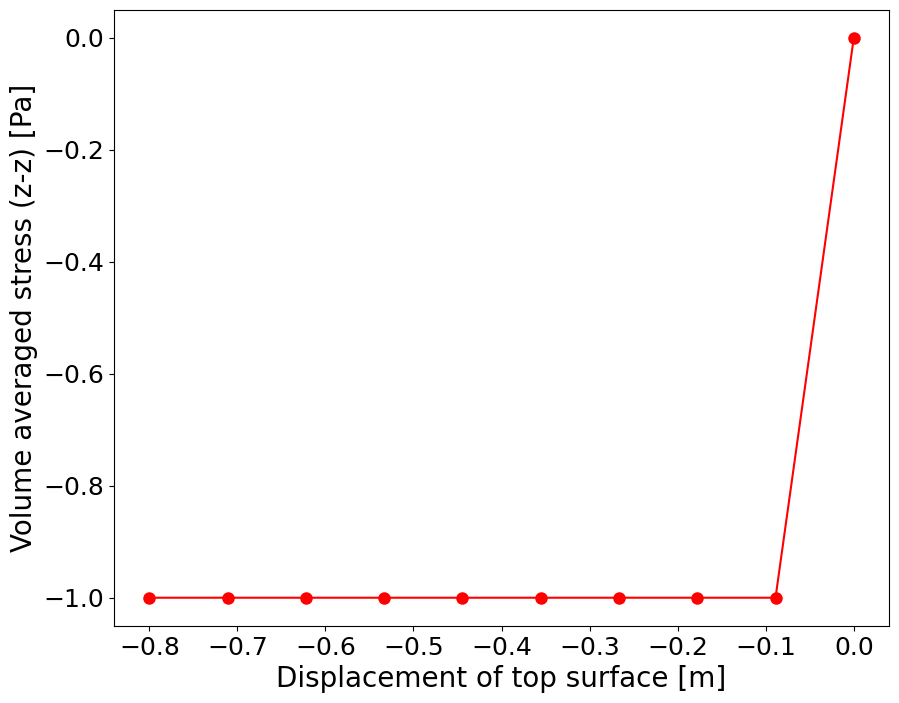

In [6]:
class Plasticity(Problem):

    def custom_init(self, additional_info = [0.1]):
        """_summary_

        Args:
            
        """
        # ceate objects for r
        self.fe = self.fes[0]
        self.epsilons_old = np.zeros((len(self.fe.cells), self.fe.num_quads, self.fe.vec, self.dim))
        self.sigmas_old = np.zeros_like(self.epsilons_old)

        # these are things that can change throughout the sim
        self.internal_vars = [self.sigmas_old, self.epsilons_old]

        # elasticity coefficients
        self.E = 100. # Pa
        self.nu = 0.05

        # aggregate params

        # get rid of these two and rewrite the stress equations
        self.mu = self.E/(2.*(1. + self.nu))
        self.lmbda = self.E*self.nu/((1+self.nu)*(1-2*self.nu))

    def get_tensor_map(self):
        # meaning: get the tensors you want to solve for.
        # we throw away the strain and density
        _, stress_return_map = self.get_maps()
        return stress_return_map
    
    def get_maps(self):
        def safe_sqrt(x):  
            # np.sqrt is not differentiable at 0
            safe_x = np.where(x > 0., np.sqrt(x), 0.)
            return safe_x

        def safe_divide(x, y):
            return np.where(y == 0., 0., x/y)


        def strain(u_grad):
            return 0.5*(u_grad + u_grad.T)
        
        def stress(eps):
            return self.lmbda*np.trace(eps)*np.eye(self.dim) + 2*self.mu*eps
        

        def stress_return_map(u_grad, sigma_old, eps_old):
            """ Calculate the new stress field from the old deformation gradient, old stress, and old strain. 

            Args:
                u_grad (_type_): _description_
                sigma_old (_type_): _description_
                eps_old (_type_): _description_

            Returns:
                _type_: _description_

            Yields:
                _type_: _description_
            """
    
            # calculate the yield strength and Young's modulus from the density field
            yield_strength = 1.
            E = 100.

            # calculate the new stress field with a radial return map
            deps = strain(u_grad) - eps_old
            sigma_trial = stress(deps) + sigma_old
            s_dev = sigma_trial - 1./self.dim*np.trace(sigma_trial)*np.eye(self.dim)
            von_Mises = safe_sqrt(3./2.*np.sum(s_dev*s_dev))
            f_yield = von_Mises - yield_strength
            f_yield_plus = np.where(f_yield > 0., f_yield, 0.)
            sigma = sigma_trial - safe_divide(f_yield_plus*s_dev,von_Mises)
            print(sigma_trial)

            return sigma
        
        return strain, stress_return_map
    
    def stress_strain_funcs(self):
        """Return mapping functions for stress, strain

        Returns:
            _type_: _description_
        """
        strain, stress_return_map = self.get_maps()
        vmap_strain = jax.vmap(jax.vmap(strain))
        vmap_stress_return_map = jax.vmap(jax.vmap(stress_return_map))
        return vmap_strain, vmap_stress_return_map
        

    def update_stress_strain_density(self, sol):
        # set new values for old stress, strain
        u_grads = self.fe.sol_to_grad(sol)
        #print(sol.shape)
        #print(u_grads.shape)
        vmap_strain, vmap_stress_rm = self.stress_strain_funcs()
        self.sigmas_old = vmap_stress_rm(u_grads, self.sigmas_old, self.epsilons_old) # use old or new density? I think old
        self.epsilons_old = vmap_strain(u_grads)
        self.internal_vars = [self.sigmas_old, self.epsilons_old]


    def compute_avg_stress(self):
        # For post-processing only: Compute volume averaged stress.
        # (num_cells*num_quads, vec, dim) * (num_cells*num_quads, 1, 1) -> (vec, dim)
        sigma = np.sum(self.sigmas_old.reshape(-1, self.fe.vec, self.dim) * self.fe.JxW.reshape(-1)[:, None, None], 0)
        vol = np.sum(self.fe.JxW)
        avg_sigma = sigma/vol
        return avg_sigma

test_num = 1 # for file naming
deform = 'foo' # deformation percentage
solver_type = 'jax_solver'
Nx, Ny, Nz = 10, 10, 10 # cells in a row
N_cells = Nx*Ny*Nz
steps = 10
deform = 0.8

# Specify mesh-related information(first-order hexahedron element).
ele_type = 'HEX8'
cell_type = get_meshio_cell_type(ele_type)
data_dir = os.path.join(os.path.dirname('/home/elouan/Compression/'), f'data_run{test_num}_{deform}_{solver_type}_{Nx}')

# box dims
Lx, Ly, Lz = 1., 1., 1.
meshio_mesh = box_mesh_gmsh(Nx=Nx, Ny=Ny, Nz=Nz, Lx=Lx, Ly=Ly, Lz=Lz, data_dir=data_dir, ele_type=ele_type)
mesh = Mesh(meshio_mesh.points, meshio_mesh.cells_dict[cell_type])



# Define boundary locations.
# this is so inefficient, I can't even use an N-d array for the center conditions. Or at least I don't know how to.
def top(point):
    return np.isclose(point[2], Lz, atol=1e-5)

def bottom(point):
    return np.isclose(point[2], 0., atol=1e-5)

def center(point):
    center_cond = np.array([[Lx/2], [Ly/2], [0.]])
    return np.isclose(point, center_cond, atol = 1e-2)

def center_x(point):
    return np.isclose(point[0], Lx/2, atol = 1e-2)

def center_y(point):
    return np.isclose(point[1], Ly/2, atol = 1e-2)
    



# Define Dirichlet boundary values.
# We fix the z-component of the displacement field to be zero on the 'bottom' 
# side, and control the z-component on the 'top' side.
def dirichlet_val_bottom(point):
    return 0.

def get_dirichlet_top(disp):
    def val_fn(point):
        return disp
    return val_fn

# compression specs
disps = np.linspace(0.,-deform,steps) # compression in the z-dir
location_fns = [center_x, center_y, bottom, top]
value_fns = [dirichlet_val_bottom]*3 + [get_dirichlet_top(disps[0])]
vecs = [0, 1, 2, 2]

dirichlet_bc_info = [location_fns, vecs, value_fns]



# Define problem, solve it and save solutions to local folder
problem = Plasticity(mesh, vec=3, dim=3, dirichlet_bc_info=dirichlet_bc_info, additional_info=[0.5])
avg_stresses = []

for i, disp in enumerate(disps):
    print(f"\nStep {i} in {len(disps)}, disp = {disp}")

    # update Dirichlet conditions 
    dirichlet_bc_info[-1][-1] = get_dirichlet_top(disp)
    
    # solve the problem
    problem.fe.update_Dirichlet_boundary_conditions(dirichlet_bc_info)
    sol_list = solver(problem, solver_options={f'{solver_type}': {}})

    # update the stress, strain and density with the solution
    problem.update_stress_strain_density(sol_list[0])
    avg_stress = problem.compute_avg_stress()
    avg_stresses.append(avg_stress)

    vtk_path = os.path.join(data_dir, f'vtk/u_{i:03d}.vtu')
    save_sol(problem.fe, sol_list[0], vtk_path)

avg_stresses = np.array(avg_stresses)


# Plot the volume-averaged stress versus the vertical displacement of the top surface.
fig = plt.figure(figsize=(10, 8))
plt.plot(disps, avg_stresses[:, 2, 2], color='red', marker='o', markersize=8, linestyle='-') 
plt.xlabel(r'Displacement of top surface [m]', fontsize=20)
plt.ylabel(r'Volume averaged stress (z-z) [Pa]', fontsize=20)
plt.tick_params(labelsize=18)
plt.savefig(f"./data_run{test_num}_{deform}_{solver_type}_{Nx}/stress-strain-{test_num}.png")
plt.show()




Why do the volumes stay the same throughout the deformation? Checked cell coordinates of the first cell, and they don't change --> the mesh doesn't warp thoughout the sim.

Update: it works! I have the densities now :3

In [ ]:
print(cell_dens[-1][50])
print(cell_vols[50])
print(cube_dens[9])


0.0003894840509703298
0.0003894840509703298
0.3894840500091944


In [ ]:
# supply indices of nodes 
coords_cell_nodes = problem.fe.points[problem.fe.cells]

cell_vols = np.zeros(N_cells)
for i in range(N_cells):
    points = coords_cell_nodes[i]
    hull = ConvexHull(points)
    cell_vols = cell_vols.at[i].set(hull.volume) # simple item assignement doesn't work with jax aparently, hence this code line instead

print(cell_vols)


[0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.